# Test: Correctness Evaluation of Annotat3d Image Processing Operations

This notebook implements bitwise comparisons between ANnotat3d custum operations and well stablished open frameworks for image processing. 

## Import libraries

Assures that the harpia module has already been compiled with cython, before (command: python3 setup.py)

In [78]:
import os
import numpy as np
import matplotlib.pyplot as plt
import csv

#using cucim
import cupy as cp
import cucim
from cucim.skimage import morphology as cucim_morph
from cucim.skimage import filters

#morphology functions
import harpia
import harpia.morphology.operations_binary as harpia_binary
import harpia.morphology.operations_grayscale as harpia_grayscale

#filters functions
import harpia.filters.filtersChunked as harpia_filters
import harpia.filters.filtersOperations as harpia_filters_op

#threshold
import harpia.threshold.thresholdChunked as thresholdChunked


In [79]:
import harpia
print(harpia.__file__) #assert it is importing the local compilation of harpia package

/ibira/lnls/labs/tepui/home/camila.araujo/.conda/envs/harpiacu12/lib/python3.9/site-packages/harpia/__init__.cpython-39-x86_64-linux-gnu.so


## Save path

In [80]:
save = True

import os
notebook_name = "test_correctness_report_cucim"
output_dir = f"{notebook_name}_plots"
os.makedirs(output_dir, exist_ok=True)
print(f"Plots will be saved to: {output_dir}")

Plots will be saved to: test_correctness_report_cucim_plots


## Framework

In [81]:
def custum_line_kernel3D():
    kernel_2d = np.array([[1, 0, 0], [1, 0, 0], [1, 0, 0]], dtype=np.int32)
    # Stack the 2D kernel to form a 3D kernel (3 layers)
    kernel_3d = np.stack([kernel_2d, kernel_2d, kernel_2d])
    return kernel_3d

In [82]:
'''
def custum_kernel3D():
    kernel_2d = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]], dtype=np.int32)
    # Stack the 2D kernel to form a 3D kernel (3 layers)
    kernel_3d = np.stack([kernel_2d, kernel_2d, kernel_2d])
    return kernel_3d
'''
def custum_kernel3D(size=1):
    """
    Create a cubic 3D kernel for erosion, where `size` is the erosion radius.

    Parameters:
    - size (int): Number of pixels to erode from each side. 
                  The resulting kernel will be of shape (2*size + 1)^3.

    Returns:
    - numpy.ndarray: A 3D structuring element for erosion.
    """
    kernel_shape = (2 * size + 1, 2 * size + 1, 2 * size + 1)
    return np.ones(kernel_shape, dtype=np.int32)

In [83]:
def custum_kernel2D():
    kernel = np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]], dtype=np.int32)
    kernel = kernel.reshape(1, kernel.shape[0], kernel.shape[1])
    return kernel

In [84]:
def load_image(path, xsize, ysize, zsize, dtype, dtype_out):
    img = np.fromfile(path, dtype=dtype)
    img = img.reshape((zsize, ysize, xsize))
    img = img.astype(dtype = dtype_out)
    return img

In [85]:
# Function to compare the results
def show_results_diff(result_custum, original_image=None, plot=False, operation = "", framework = "", 
                 slice_num = 0, figsize=(18, 6), save_path=None):  
    fontsize = 18
    # Perform bitwise comparison
    bitwise_diff = np.abs(original_image.astype(np.int32) - result_custum.astype(np.int32))
    
    if(plot):
        if(len(original_image.shape)==3):
            original_slice = original_image[slice_num,:,:]
            slice_groudtruth = result_groudtruth[slice_num,:,:]
            slice_custum = result_custum[slice_num,:,:]
            slice_diff = bitwise_diff[slice_num,:,:]
        # Visual comparison
        plt.figure(figsize=figsize)

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(original_slice, cmap='gray')
        plt.title("Original Image", fontsize = fontsize)
        plt.axis('off')

        # Custum result
        plt.subplot(1, 3, 2)
        plt.imshow(slice_custum, cmap='gray')
        plt.title(f"Annotat3d {operation}", fontsize = fontsize)
        plt.axis('off')

        # Bitwise difference
        plt.subplot(1, 3, 3)
        plt.imshow(slice_diff, cmap='hot')
        plt.title("Bitwise Difference", fontsize = fontsize)
        plt.axis('off')

        plt.tight_layout()
        
        # Save the plot if a save path is provided
        if save_path:
            plt.savefig(save_path, bbox_inches='tight')
        
        plt.show()
    
    return 

In [86]:
def show_results(result_custum, original_image=None, plot=False, operation = "", framework = "", 
                 slice_num = 0, figsize=(18, 6), save_path=None):  
    fontsize = 18
    # Perform bitwise comparison
    bitwise_diff = np.abs(original_image.astype(np.int32) - result_custum.astype(np.int32))
    
    if(plot):
        if(len(original_image.shape)==3):
            original_slice = original_image[slice_num,:,:]
            slice_groudtruth = result_groudtruth[slice_num,:,:]
            slice_custum = result_custum[slice_num,:,:]
            slice_diff = bitwise_diff[slice_num,:,:]
        # Visual comparison
        plt.figure(figsize=figsize)

        # Original image
        plt.subplot(1, 2, 1)
        plt.imshow(original_slice, cmap='gray')
        plt.title("Original Image", fontsize = fontsize)
        plt.axis('off')
        
        # Custum result
        plt.subplot(1, 2, 2)
        plt.imshow(slice_custum, cmap='gray')
        plt.title(f"Annotat3d {operation}", fontsize = fontsize)
        plt.axis('off')

        plt.tight_layout()
        
        # Save the plot if a save path is provided
        if save_path:
            plt.savefig(save_path, bbox_inches='tight')
        
        plt.show()
    
    return 

In [87]:
def compare_results(result_custum, result_groudtruth, original_image=None, plot=False, operation="", framework="", 
                    slice_num=0, figsize=(18, 6), save_path=None):
    fontsize = 18
    eps = 1e-8  # to prevent division by zero

    # Relative error in percentage
    relative_error = 100.0 * np.abs(result_groudtruth - result_custum) / (np.abs(result_groudtruth) + eps)

    if plot and original_image is not None and len(original_image.shape) == 3:
        original_slice = original_image[slice_num, :, :]
        slice_groudtruth = result_groudtruth[slice_num, :, :]
        slice_custum = result_custum[slice_num, :, :]

        plt.figure(figsize=figsize)

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(original_slice, cmap='gray')
        plt.title("Original Image", fontsize=fontsize)
        plt.axis('off')

        # Ground truth result
        plt.subplot(1, 3, 2)
        plt.imshow(slice_groudtruth, cmap='gray')
        plt.title(f"{framework} {operation}", fontsize=fontsize)
        plt.axis('off')

        # Custom result
        plt.subplot(1, 3, 3)
        plt.imshow(slice_custum, cmap='gray')
        plt.title(f"Annotat3d {operation}", fontsize=fontsize)
        plt.axis('off')

        plt.tight_layout()
        if save_path:
            plt.savefig(save_path, bbox_inches='tight')
        plt.show()

    # Filter out invalid values (e.g., inf or nan)
    rel_err_flat = relative_error[np.isfinite(relative_error)]

    # Compute percentage-based statistics
    mean_rel_error = rel_err_flat.mean()
    std_rel_error = rel_err_flat.std()
    accuracy = 100 - mean_rel_error

    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Mean Relative Error: {mean_rel_error:.2f}%")
    print(f"Std Dev of Relative Error: {std_rel_error:.2f}%")

    # ----------- Save CSV Logging -----------
    if save_path:
        csv_path = os.path.join(os.path.dirname(save_path), "comparison_results.csv")

        file_exists = os.path.isfile(csv_path)

        with open(csv_path, mode='a', newline='') as csvfile:
            writer = csv.writer(csvfile)

            if not file_exists:
                writer.writerow([
                    "Operation", "Framework", "Image Shape", "Image Size (MiB)",
                    "Accuracy", "Mean Relative Error", "Std Dev of Relative Error"
                ])

            image_shape_str = str(original_image.shape)
            image_size_mib = original_image.nbytes / (1024 * 1024)

            writer.writerow([
                operation,
                framework,
                image_shape_str,
                f"{image_size_mib:.2f}",
                f"{accuracy:.2f}",
                f"{mean_rel_error:.2f}",
                f"{std_rel_error:.2f}",
            ])



In [88]:
# Function to compare the results
def compare_results_bitwise(result_custum, result_groudtruth, original_image=None, plot=False, operation="", framework="", 
                    slice_num=0, figsize=(18, 6), save_path=None):  
    fontsize = 18
    # Perform bitwise comparison
    bitwise_diff = np.abs(result_groudtruth.astype(np.int32) - result_custum.astype(np.int32))
    
    if plot:
        if len(original_image.shape) == 3:
            original_slice = original_image[slice_num, :, :]
            slice_groudtruth = result_groudtruth[slice_num, :, :]
            slice_custum = result_custum[slice_num, :, :]
        
        # Visual comparison without bitwise difference
        plt.figure(figsize=figsize)

        # Original image
        plt.subplot(1, 3, 1)
        plt.imshow(original_slice, cmap='gray')
        plt.title("Original Image", fontsize=fontsize)
        plt.axis('off')

        # Ground truth result
        plt.subplot(1, 3, 2)
        plt.imshow(slice_groudtruth, cmap='gray')
        plt.title(f"{framework} {operation}", fontsize=fontsize)
        plt.axis('off')

        # Custom result
        plt.subplot(1, 3, 3)
        plt.imshow(slice_custum, cmap='gray')
        plt.title(f"Annotat3d {operation}", fontsize=fontsize)
        plt.axis('off')

        plt.tight_layout()
        
        # Save the plot if a save path is provided
        if save_path:
            plt.savefig(save_path, bbox_inches='tight')
        
        plt.show()
    
    # Return pixel-wise statistics
    total_pixels = np.prod(original_image.shape)
    num_diff_pixels = np.count_nonzero(bitwise_diff)
    bitwise_diff_mean = bitwise_diff.mean()
    bitwise_diff_std = bitwise_diff.std()
    accuracy = ((total_pixels - num_diff_pixels) / total_pixels) * 100
    print(f"Total pixels: {total_pixels}")
    print(f"Different pixels: {num_diff_pixels}")
    print(f"Accuracy: {accuracy:.2f}%")
    print(f"Difference value: {bitwise_diff_mean:.2f} ± {bitwise_diff_std:.2f}")

    # ----------- Save CSV Logging -----------
    if save_path:
        csv_path = os.path.join(os.path.dirname(save_path), "comparison_results_bitwise.csv")

        file_exists = os.path.isfile(csv_path)

        with open(csv_path, mode='a', newline='') as csvfile:
            writer = csv.writer(csvfile)

            if not file_exists:
                writer.writerow([
                    "Operation", "Framework", "Image Shape", "Image Size (MiB)",
                    "Accuracy", "Mean Bitwise Difference", "Std Dev of Bitwise Difference"
                ])

            image_shape_str = str(original_image.shape)
            image_size_mib = original_image.nbytes / (1024 * 1024)

            writer.writerow([
                operation,
                framework,
                image_shape_str,
                f"{image_size_mib:.2f}",
                f"{accuracy}",
                f"{bitwise_diff_mean:.2f}",
                f"{bitwise_diff_std:.2f}",
            ])
    return


## Grayscale input

In [89]:
# original img
xsize = 190
ysize = 207
zsize_original = 100
zsize = 100
image = load_image("../../example_images/grayscale/crua_A_190x207x100_16b.raw", xsize, ysize, zsize_original,'uint16', 'float32')
image = image[:zsize,:,:] #reduce size
image_slice = image[0,:,:]
image_slice3D = np.expand_dims(image_slice, axis=-1).reshape((1, ysize, xsize))


In [90]:
'''
# original img
xsize = 1540
ysize = 1540
zsize_original = 1000
zsize = 1000
image = load_image("/ibira/lnls/labs/tepui/home/egon.borges/workshop/Recon_fdk__tomo_z1_930_z1z2_1000_esp_1264_expt_1s_000_1540x1540x1000_float32.raw", xsize, ysize, zsize_original,'float32', 'float32')
image = image[:zsize,:,:] #reduce size
image_slice = image[0,:,:]
image_slice3D = np.expand_dims(image_slice, axis=-1).reshape((1, ysize, xsize))
'''

'\n# original img\nxsize = 1540\nysize = 1540\nzsize_original = 1000\nzsize = 1000\nimage = load_image("/ibira/lnls/labs/tepui/home/egon.borges/workshop/Recon_fdk__tomo_z1_930_z1z2_1000_esp_1264_expt_1s_000_1540x1540x1000_float32.raw", xsize, ysize, zsize_original,\'float32\', \'float32\')\nimage = image[:zsize,:,:] #reduce size\nimage_slice = image[0,:,:]\nimage_slice3D = np.expand_dims(image_slice, axis=-1).reshape((1, ysize, xsize))\n'

## Filters 2D

### Sobel

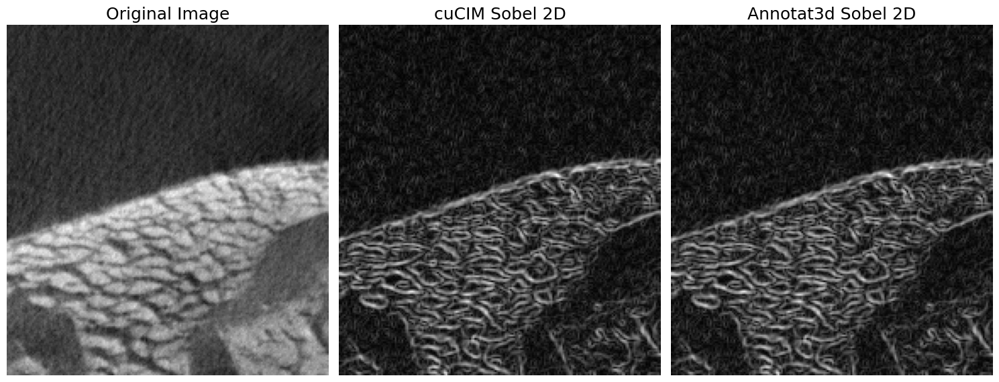

Accuracy: -364.72%
Mean Relative Error: 464.72%
Std Dev of Relative Error: 43.70%


In [91]:
result_groudtruth = filters.sobel(cp.array(image_slice)).get()
result_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))

result_custum = harpia_filters.sobelFilter(image_slice3D)
result_custum=result_custum.reshape(result_groudtruth3D.shape)

compare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Sobel 2D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/sobel_2D.png")

### Prewitt

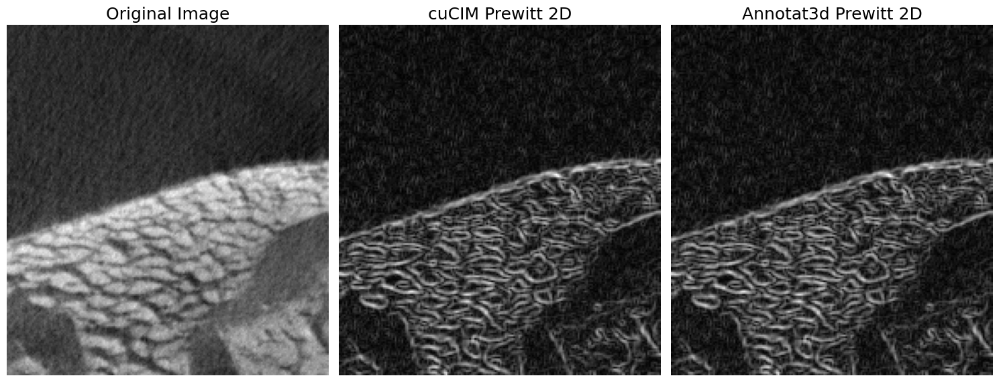

Accuracy: -223.90%
Mean Relative Error: 323.90%
Std Dev of Relative Error: 32.79%


In [92]:
result_groudtruth = filters.prewitt(cp.array(image_slice)).get()
result_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))
result_custum = harpia_filters.prewittFilter(image_slice3D)
result_custum=result_custum.reshape(result_groudtruth3D.shape)

compare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Prewitt 2D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/prewitt_2D.png")

### Unsharp Mask

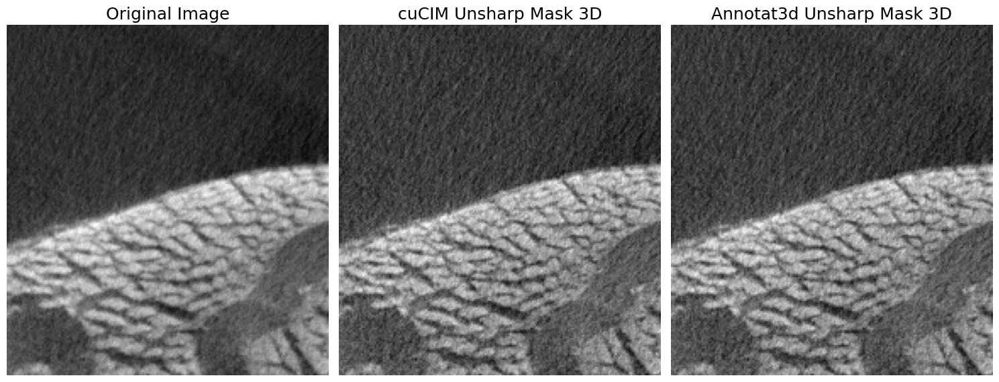

Accuracy: 99.98%
Mean Relative Error: 0.02%
Std Dev of Relative Error: 0.03%


In [130]:
result_groudtruth = filters.unsharp_mask(cp.array(image),1,1,preserve_range=True).get()
result_custum = harpia_filters.unsharpMaskFilter(image)

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Unsharp Mask 3D", framework="cuCIM", 
                slice_num=10, figsize = (15,30), save_path=f"{output_dir}/unsharp_mask_3D.png")

### Gaussian

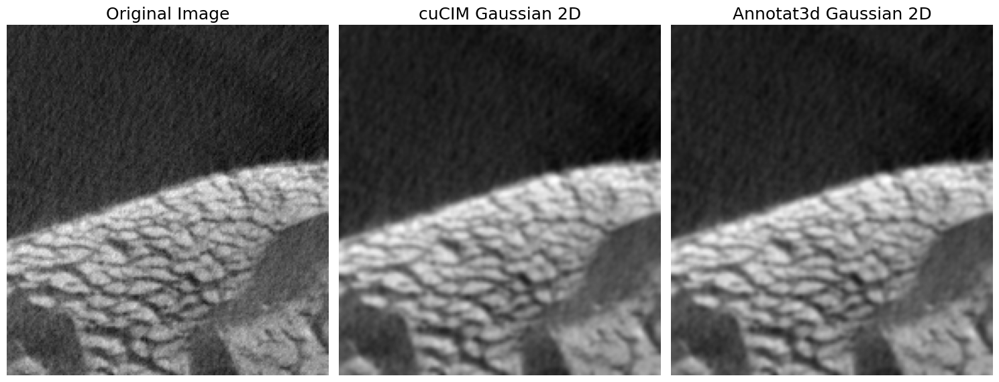

Accuracy: 99.98%
Mean Relative Error: 0.02%
Std Dev of Relative Error: 0.03%


In [94]:
result_groudtruth = filters.gaussian(cp.array(image_slice),1,mode='reflect',preserve_range=True).get()
result_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))
result_custum = harpia_filters.gaussianFilter(image_slice3D)
result_custum=result_custum.reshape(result_groudtruth3D.shape)

compare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Gaussian 2D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/gaussian_2D.png")

### Mean

In [96]:
'''#se aumenta o window size dá errado -> mesmo problema do gaussiano, achoq ue tem a ver com o kernel, ele não deve estar sendo passado para o chunkedExecutor
kernel = np.full((1,1),1.0)
result_groudtruth = ndimage.convolve(image_slice,kernel)/(1*1)
result_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))

result_custum = harpia_filters.meanFilter(hostImage=image_slice3D, windowSize=1)
result_custum=result_custum.reshape(result_groudtruth3D.shape)

compare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Mean 2D", framework="scipy", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/mean_2D.png")'''

'#se aumenta o window size dá errado -> mesmo problema do gaussiano, achoq ue tem a ver com o kernel, ele não deve estar sendo passado para o chunkedExecutor\nkernel = np.full((1,1),1.0)\nresult_groudtruth = ndimage.convolve(image_slice,kernel)/(1*1)\nresult_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))\n\nresult_custum = harpia_filters.meanFilter(hostImage=image_slice3D, windowSize=1)\nresult_custum=result_custum.reshape(result_groudtruth3D.shape)\n\ncompare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Mean 2D", framework="scipy", \n                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/mean_2D.png")'

In [97]:
'''#se aumenta o window size dá errado -> mesmo problema do gaussiano, acho que tem a ver com o kernel, ele não deve estar sendo passado para o chunkedExecutor
kernel = np.full((3,3),1.0)
result_groudtruth = ndimage.convolve(image_slice,kernel)/(3*3)
result_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))

result_custum = harpia_filters.meanFilter(hostImage=image_slice3D, windowSize=3)
result_custum=result_custum.reshape(result_groudtruth3D.shape)

compare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Mean 2D", framework="scipy", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/mean_2D.png")'''

'#se aumenta o window size dá errado -> mesmo problema do gaussiano, acho que tem a ver com o kernel, ele não deve estar sendo passado para o chunkedExecutor\nkernel = np.full((3,3),1.0)\nresult_groudtruth = ndimage.convolve(image_slice,kernel)/(3*3)\nresult_groudtruth3D = np.expand_dims(result_groudtruth, axis=-1).reshape((1, ysize, xsize))\n\nresult_custum = harpia_filters.meanFilter(hostImage=image_slice3D, windowSize=3)\nresult_custum=result_custum.reshape(result_groudtruth3D.shape)\n\ncompare_results(result_custum, result_groudtruth3D, image_slice3D, plot=True, operation = "Mean 2D", framework="scipy", \n                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/mean_2D.png")'

## Filters 3D

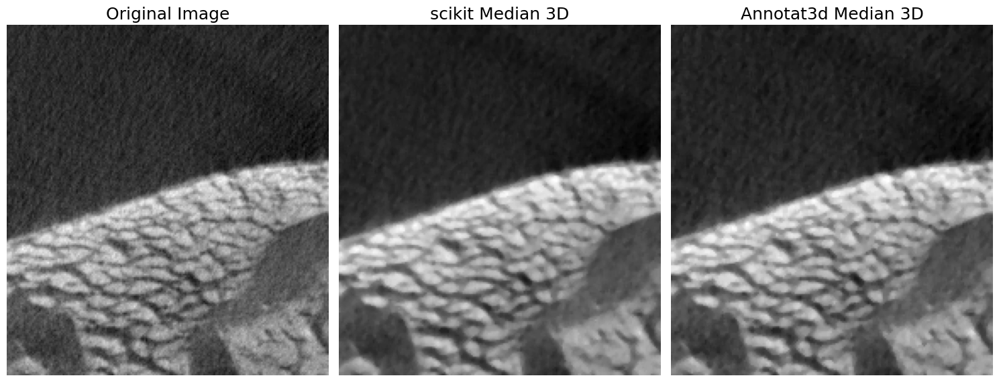

Accuracy: 99.61%
Mean Relative Error: 0.39%
Std Dev of Relative Error: 0.41%


In [98]:
#harpia median function cannot operate on images that exceed gpu RAM memory, it is cannot be broken in chunks
result_groudtruth = filters.median(cp.array(image)).get()
result_custum = harpia_filters_op.median(image, nx=3, ny=3, nz=3)

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Median 3D", framework="scikit", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/median_3D.png")

### Sobel

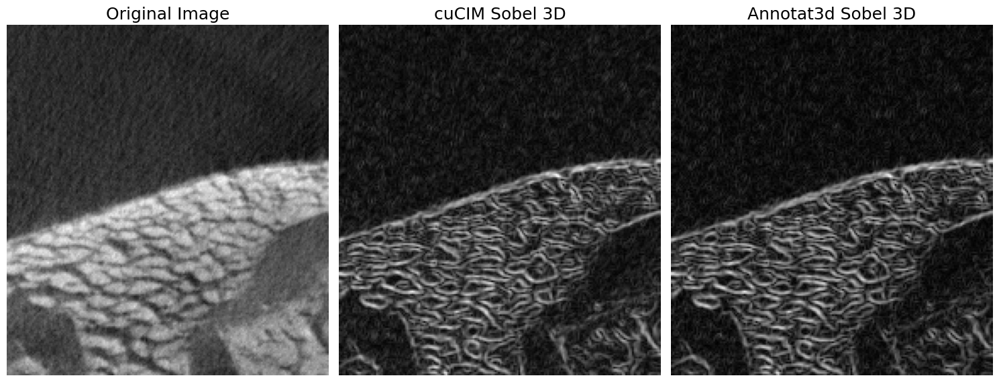

Accuracy: -2563.40%
Mean Relative Error: 2663.40%
Std Dev of Relative Error: 157.08%


In [99]:
result_groudtruth = filters.sobel(cp.array(image)).get()
result_custum = harpia_filters.sobelFilter(image)

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Sobel 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/sobel_3D.png")

### Prewitt

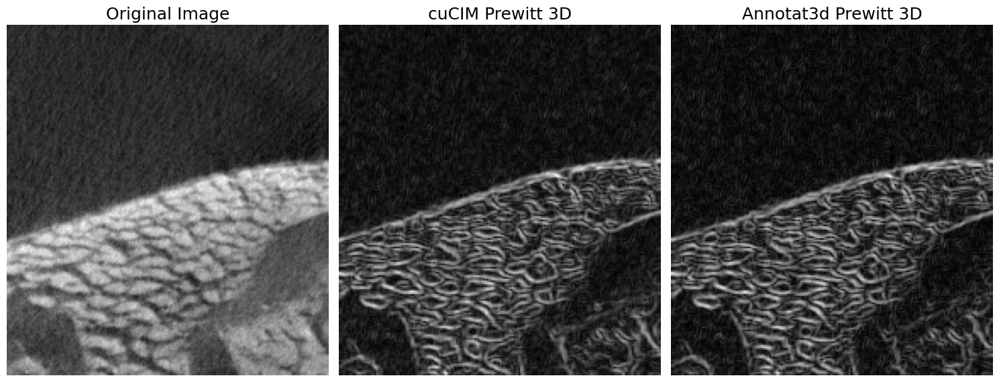

Accuracy: -1356.83%
Mean Relative Error: 1456.83%
Std Dev of Relative Error: 107.54%


In [100]:
result_groudtruth = filters.prewitt(cp.array(image)).get()
result_custum = harpia_filters.prewittFilter(image)

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Prewitt 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/prewitt_3D.png")

## Threshold

### Sauvola

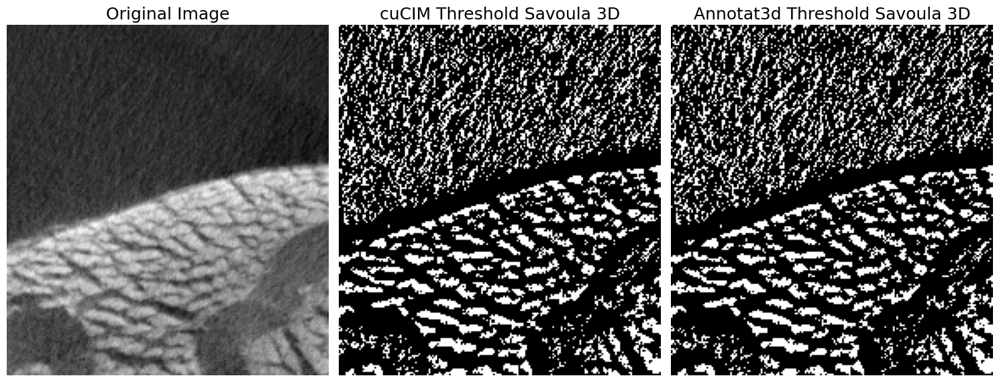

Total pixels: 3933000
Different pixels: 3121
Accuracy: 99.92%
Difference value: 0.20 ± 7.18


In [101]:
result_groudtruth = image > filters.threshold_sauvola(cp.array(image), window_size=15, k=0.000020, r=None).get()
result_groudtruth = (result_groudtruth.astype(np.uint8)) * 255
out = thresholdChunked.sauvolaThreshold(hostImage=image, hostOutput = None, windowSize = 15, weight=0.000020, type3d=1)

compare_results_bitwise(out, result_groudtruth, image, plot=True, operation = "Threshold Savoula 3D", framework="cuCIM", 
                slice_num=10, figsize = (15,30), save_path=f"{output_dir}/threshold_savoula_3D.png")

### Niblack

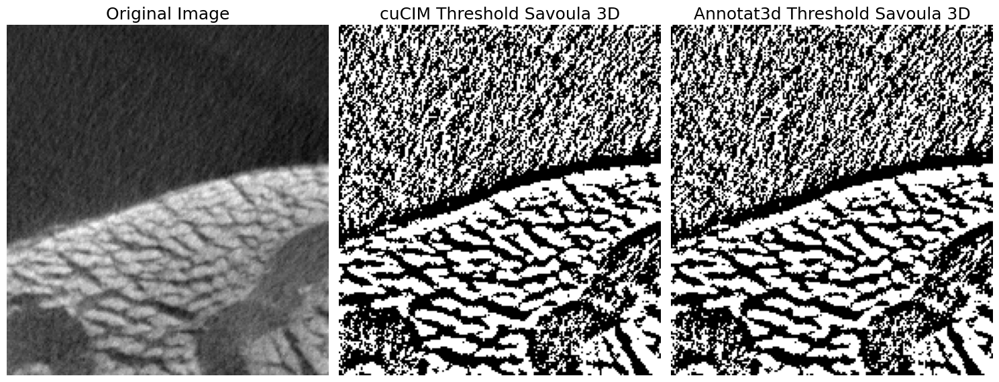

Total pixels: 3933000
Different pixels: 3099
Accuracy: 99.92%
Difference value: 0.20 ± 7.16


In [102]:
result_groudtruth = image > filters.threshold_niblack(cp.array(image), window_size=15, k=0.000020).get()
result_groudtruth = (result_groudtruth.astype(np.uint8)) * 255
out = thresholdChunked.niblackThreshold(hostImage=image, hostOutput = None, windowSize = 15, weight=0.000020, type3d=1)

compare_results_bitwise(out, result_groudtruth, image, plot=True, operation = "Threshold Savoula 3D", framework="cuCIM", 
                slice_num=10, figsize = (15,30), save_path=f"{output_dir}/threshold_savoula_3D.png")

### Mean

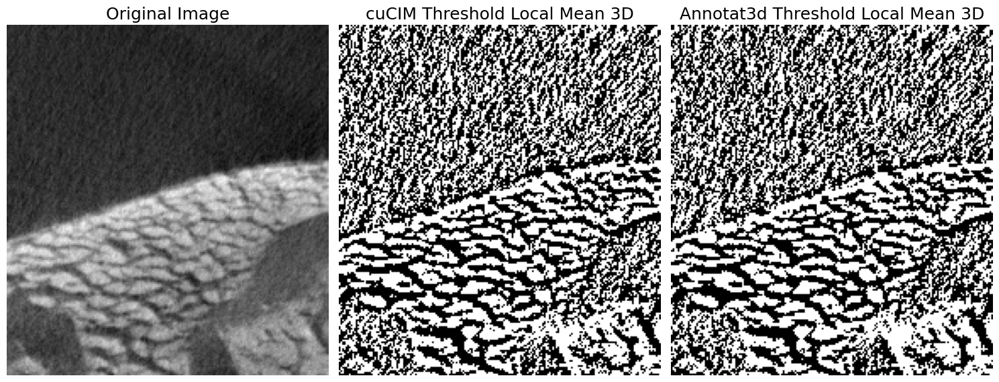

Total pixels: 3933000
Different pixels: 3220
Accuracy: 99.92%
Difference value: 0.21 ± 7.29


In [128]:
result_groudtruth = image > filters.threshold_local(cp.array(image), block_size=7, method='mean', mode='reflect').get()
result_groudtruth = (result_groudtruth.astype(np.uint8)) * 255
out = thresholdChunked.meanThreshold(hostImage=image,type3d=1, windowSize=7)

compare_results_bitwise(out, result_groudtruth, image, plot=True, operation = "Threshold Local Mean 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/threshold_mean_3D.png")


### Gaussian

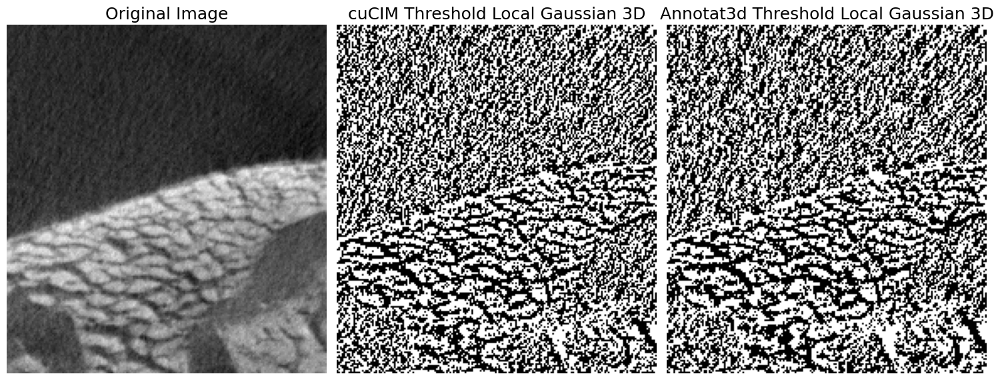

Total pixels: 3933000
Different pixels: 4448
Accuracy: 99.89%
Difference value: 0.29 ± 8.57


In [103]:
result_groudtruth = image > filters.threshold_local(cp.array(image), block_size=7, method='gaussian', mode='reflect').get()
result_groudtruth = (result_groudtruth.astype(np.uint8)) * 255
out = thresholdChunked.gaussianThreshold(hostImage=image,hostOutput = None,sigma = 1, type3d=1)

compare_results_bitwise(out, result_groudtruth, image, plot=True, operation = "Threshold Local Gaussian 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/threshold_gaussian_3D.png")


## Morphology grayscale operations in 3D 

### Erosion

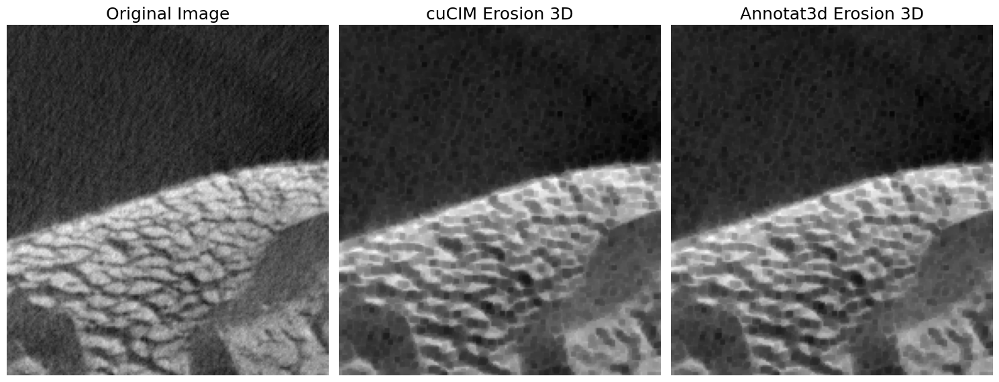

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [104]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_grayscale.erosion_grayscale(image, kernel, gpuMemory = 0.01)
result_custum = result_custum.squeeze()

selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.erosion(cp.asarray(image), selem).get()

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Erosion 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_erosion.png")

### Dilation 

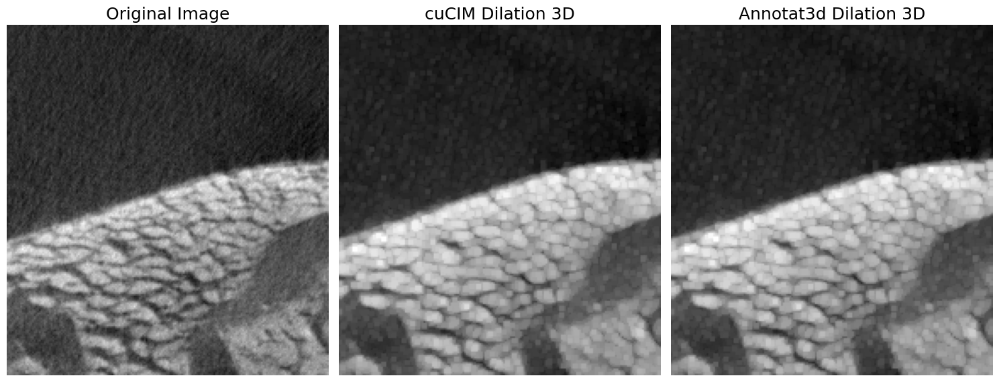

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [105]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_grayscale.dilation_grayscale(image, kernel)
result_custum = result_custum.squeeze()

#cuCIM operation
selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.dilation(cp.asarray(image), selem).get()

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Dilation 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_dilation.png")

### Opening 

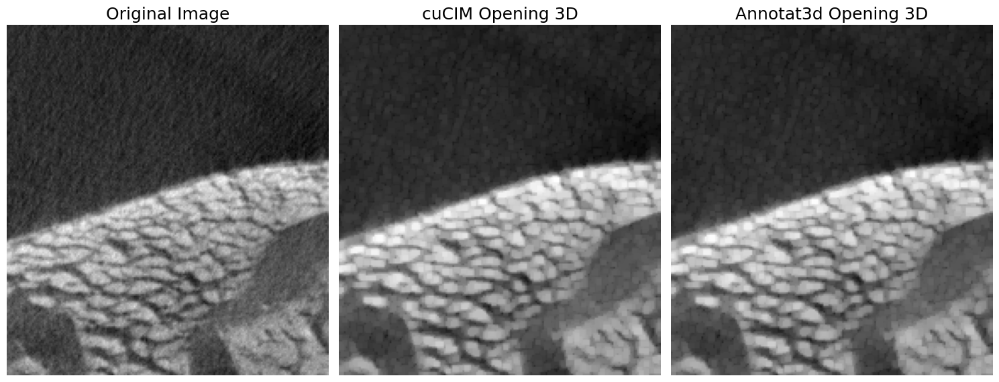

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [106]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_grayscale.opening_grayscale(image, kernel)
result_custum = result_custum.squeeze()

#cuCIM operation
selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.opening(cp.asarray(image), selem).get()

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Opening 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_opening.png")

### Closing

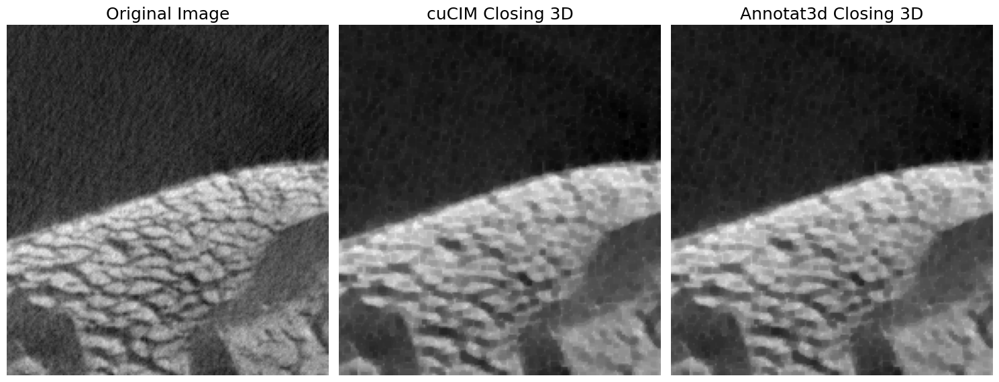

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [107]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_grayscale.closing_grayscale(image, kernel)
result_custum = result_custum.squeeze()

#cuCIM operation
selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.closing(cp.asarray(image), selem).get()

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Closing 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_closing.png")

### Reconstruction

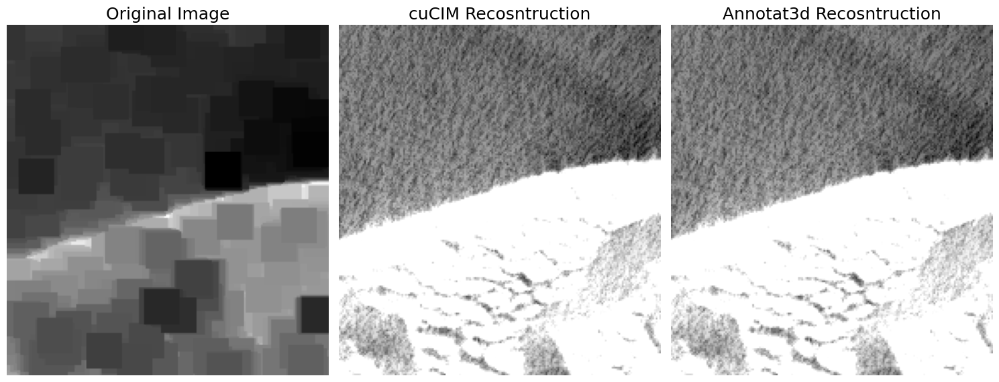

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [108]:
#Custum operation
kernel = custum_kernel3D()
marker = image
for i in range(10):
    marker = harpia_grayscale.erosion_grayscale(marker, kernel)
result_custum = harpia_grayscale.reconstruction_grayscale(marker,image, "dilation")
result_custum = result_custum.squeeze()

#cuCIM operation
result_groudtruth = cucim_morph.reconstruction(cp.asarray(marker),cp.asarray(image), method='dilation').get()

compare_results(result_custum, result_groudtruth, marker, plot=True, operation = "Recosntruction", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_reconstruction_dilation.png")

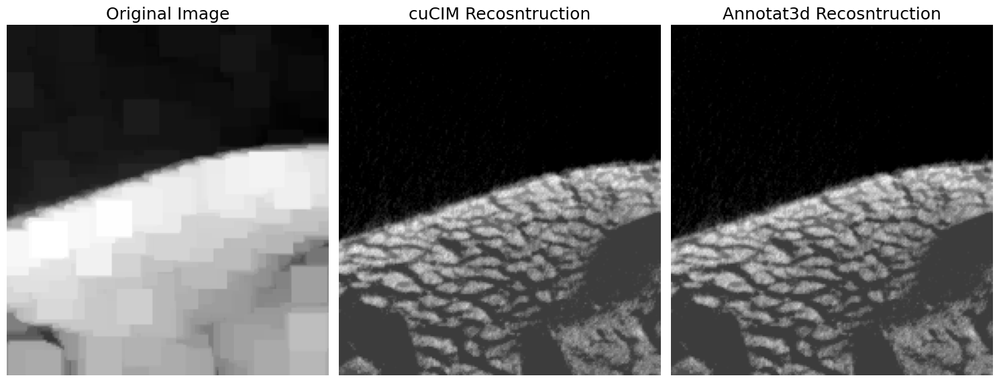

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [109]:
#Custum operation
kernel = custum_kernel3D()
marker = image
for i in range(10):
    marker = harpia_grayscale.dilation_grayscale(marker, kernel)
result_custum = harpia_grayscale.reconstruction_grayscale(marker,image, "erosion")
result_custum = result_custum.squeeze()

#cuCIM operation
result_groudtruth = cucim_morph.reconstruction(cp.asarray(marker),cp.asarray(image), method='erosion').get()

compare_results(result_custum, result_groudtruth, marker, plot=True, operation = "Recosntruction", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_reconstruction_erosion.png")

### Top hat (White tophat)

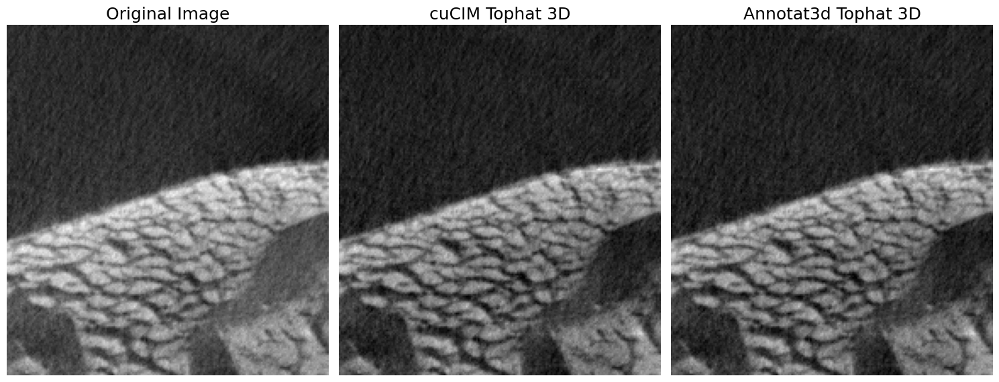

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [110]:
#Custum operation
kernel_size = 20
kernel = custum_kernel3D(kernel_size)
result_custum = harpia_grayscale.top_hat(image, kernel)
result_custum = result_custum.squeeze()

#cuCIM operation
selem = cucim_morph.footprints.cube(kernel_size*2+1)
result_groudtruth = cucim_morph.white_tophat(cp.asarray(image), selem).get()

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "Tophat 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_tophat.png")

### Bottom hat (Black tophat)

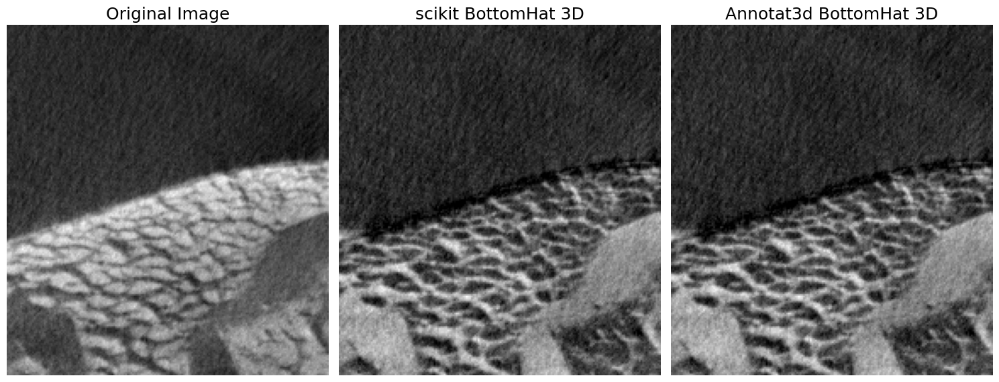

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [111]:
#Custum operation
kernel_size = 20
kernel = custum_kernel3D(kernel_size)
result_custum = harpia_grayscale.bottom_hat(image, kernel)
result_custum = result_custum.squeeze()

#cuCIM operation
selem = cucim_morph.footprints.cube(kernel_size*2+1)
result_groudtruth = cucim_morph.black_tophat(cp.asarray(image), selem).get()

compare_results(result_custum, result_groudtruth, image, plot=True, operation = "BottomHat 3D", framework="scikit", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/grayscale_bottomhat.png")

### Top hat recosntruction (Avizo's inspired algorithm)

This algorithm was inspired by Avizo's implementation of the TopHat segemntation. We did not have acces to the Avizo's results to make a bitwise comparison.
(Ref: https://www.thermofisher.com/software-em-3d-vis/xtra-library/xtras/interactive-top-hat-by-reconstruction)

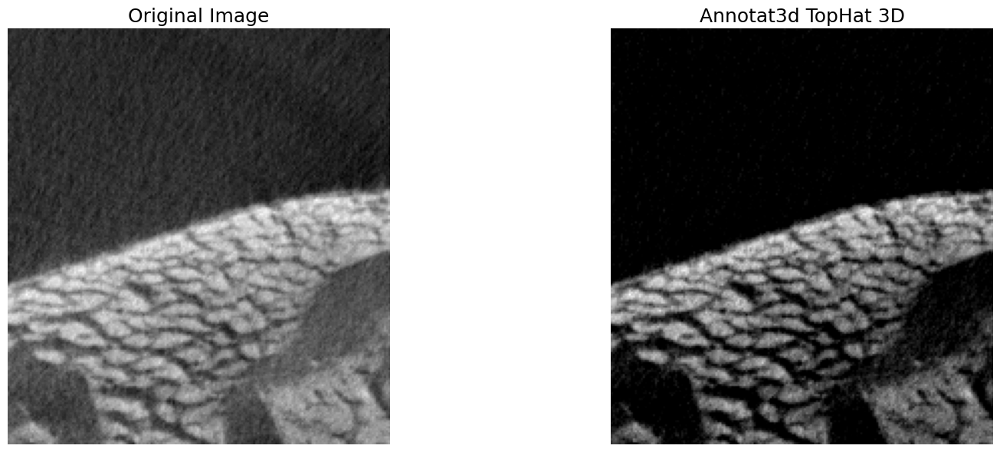

In [112]:
#Custum operation
kernel_size = 13

kernel = custum_kernel3D(kernel_size)
result_custum = harpia_grayscale.top_hat_reconstruction(image, kernel)
result_custum = result_custum.squeeze()

show_results(result_custum, image, plot=True, operation = "TopHat 3D", slice_num=0, save_path=f"{output_dir}/grayscale_tophat_reconstruction.png")

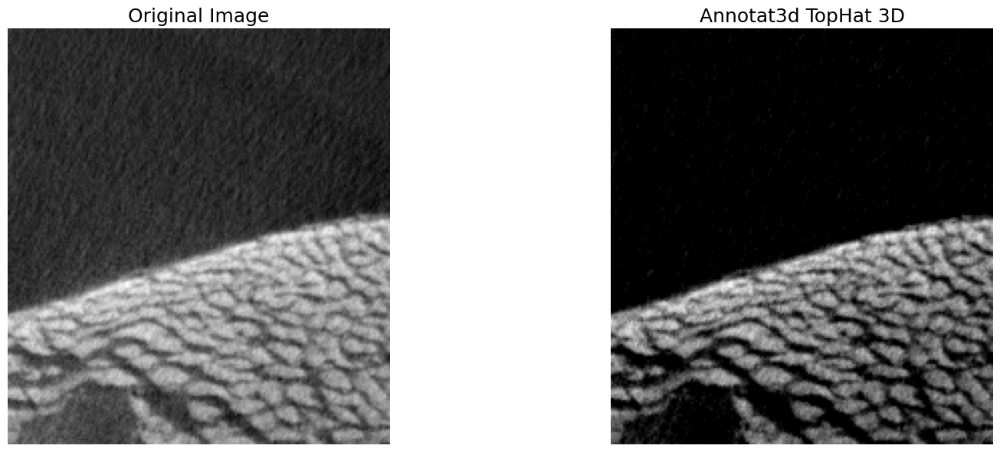

In [113]:
show_results(result_custum, image, plot=True, operation = "TopHat 3D", slice_num=50, save_path=f"{output_dir}/grayscale_tophat_reconstruction.png")

### Bottom hat recosntruction (Avizo's inspired algorithm)

This algorithm was inspired by Avizo's implementation of the TopHat segemntation. We did not have acces to the Avizo's results to make a bitwise comparison.
(Ref: https://www.thermofisher.com/software-em-3d-vis/xtra-library/xtras/interactive-top-hat-by-reconstruction)

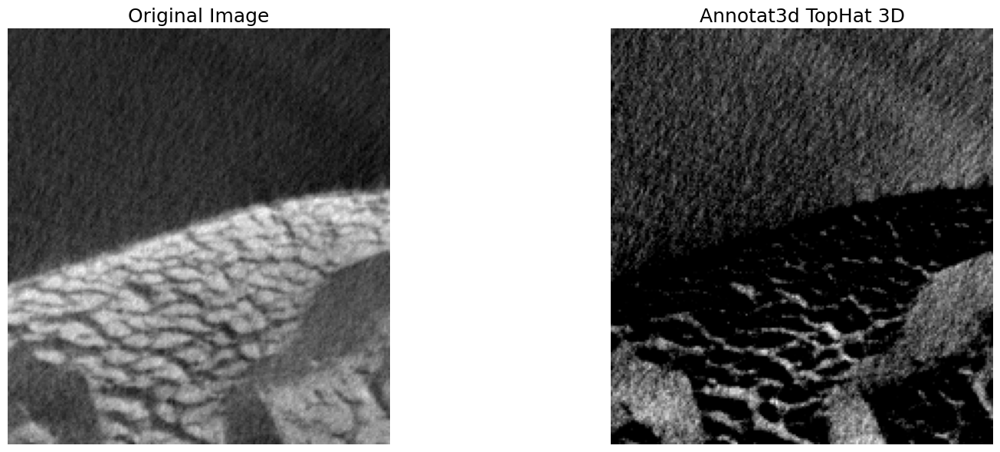

In [114]:
#Custum operation
kernel_size = 20
kernel = custum_kernel3D(kernel_size)
result_custum = harpia_grayscale.bottom_hat_reconstruction(image, kernel)
result_custum = result_custum.squeeze()

show_results(result_custum, image, plot=True, operation = "TopHat 3D", slice_num=0, save_path=f"{output_dir}/grayscale_bottomhat_reconstruction.png")

In [115]:
def process_image(data, plot=False):
    zsize, ysize, xsize = data.shape  # Get dimensions
    binarized_data = np.empty_like(data, dtype = 'int32')  # Prepare output array of same shape

    for slice_idx in range(zsize):
        slice_data = data[slice_idx, :, :]

        # Find min and max for the current slice
        min_val = slice_data.min()
        max_val = slice_data.max()

        # Compute threshold
        threshold = (max_val + min_val) // 2

        # Apply threshold to the slice to create a binary image
        binarized_slice = np.where(slice_data >= threshold, 1, 0)

        # Store the binarized slice in the output array
        binarized_data[slice_idx, :, :] = binarized_slice

    # Plot the first slice if plot flag is True
    if plot:
        plt.figure(figsize=(10, 4))

        # Plot original first slice
        plt.subplot(1, 2, 1)
        plt.imshow(data[0, :, :], cmap='gray')
        plt.title('Original First Slice')
        plt.axis('off')

        # Plot binarized first slice
        plt.subplot(1, 2, 2)
        plt.imshow(binarized_data[0, :, :], cmap='gray')
        plt.title('Binarized First Slice')
        plt.axis('off')

        plt.show()

    return binarized_data

## Binary input

In [116]:

# original img
xsize = 190
ysize = 207
zsize_original = 100
zsize = 100
image_binary = load_image("../../example_images/binary/crua_A_190x207x100_16b.raw", xsize, ysize, zsize_original,'uint16', 'int32')
image_binary = image_binary[:zsize,:,:] #reduce size
image_binary_slice = image_binary[0,:,:]
image_binary_slice3D = np.expand_dims(image_binary_slice, axis=-1).reshape((1, ysize, xsize))



In [117]:
'''
# original img
xsize = 1540
ysize = 1540
zsize_original = 1000
zsize = 1000
image_binary = load_image("/ibira/lnls/labs/tepui/home/egon.borges/workshop/Recon_fdk__tomo_z1_930_z1z2_1000_esp_1264_expt_1s_000_1540x1540x1000_float32.raw", xsize, ysize, zsize_original,'float32', 'float32')
image_binary = image_binary[:zsize,:,:] #reduce size
image_binary_slice = image_binary[0,:,:]
image_binary_slice3D = np.expand_dims(image_binary_slice, axis=-1).reshape((1, ysize, xsize))

'''

'\n# original img\nxsize = 1540\nysize = 1540\nzsize_original = 1000\nzsize = 1000\nimage_binary = load_image("/ibira/lnls/labs/tepui/home/egon.borges/workshop/Recon_fdk__tomo_z1_930_z1z2_1000_esp_1264_expt_1s_000_1540x1540x1000_float32.raw", xsize, ysize, zsize_original,\'float32\', \'float32\')\nimage_binary = image_binary[:zsize,:,:] #reduce size\nimage_binary_slice = image_binary[0,:,:]\nimage_binary_slice3D = np.expand_dims(image_binary_slice, axis=-1).reshape((1, ysize, xsize))\n\n'

## Morphology binary operations in 3D 

### Erosion

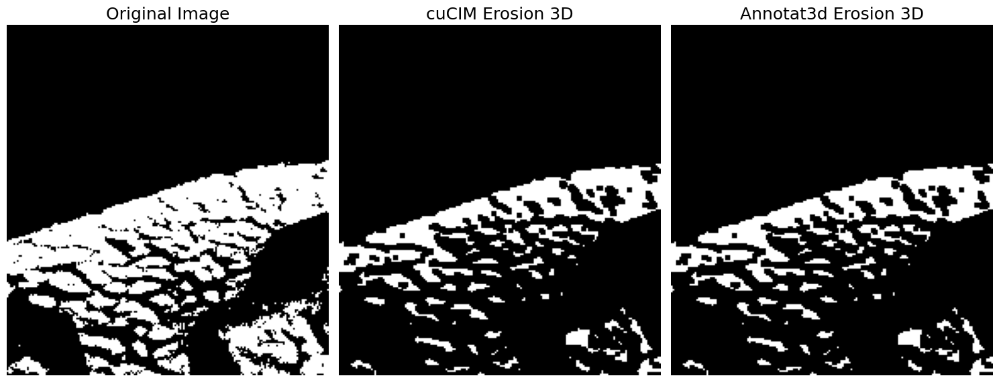

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [118]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_binary.erosion_binary(image_binary, kernel)
result_custum = result_custum.squeeze()

selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.binary_erosion(cp.asarray(image_binary), selem).get()

compare_results(result_custum, result_groudtruth, image_binary, plot=True, operation = "Erosion 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/binary_erosion.png")

In [119]:
#https://docs.rapids.ai/api/cucim/stable/api/#module-cucim.core.operations.morphology

### Dilation 

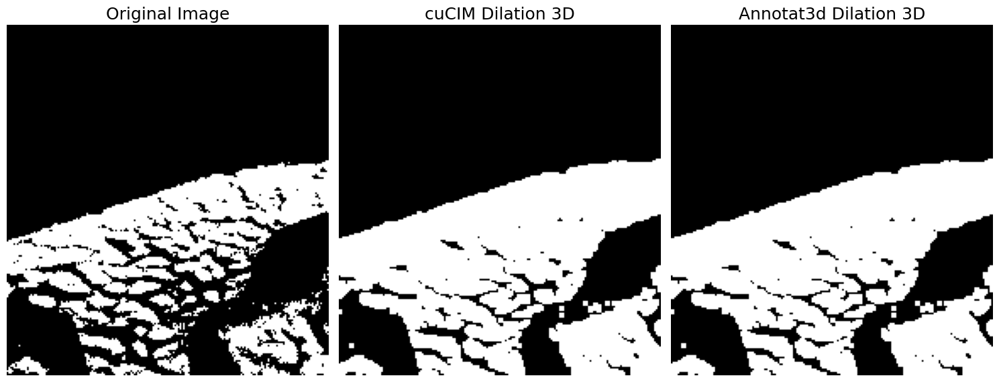

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [120]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_binary.dilation_binary(image_binary, kernel)
result_custum = result_custum.squeeze()

selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.binary_dilation(cp.asarray(image_binary), selem).get()

compare_results(result_custum, result_groudtruth, image_binary, plot=True, operation = "Dilation 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/binary_dilation.png")

### Opening 

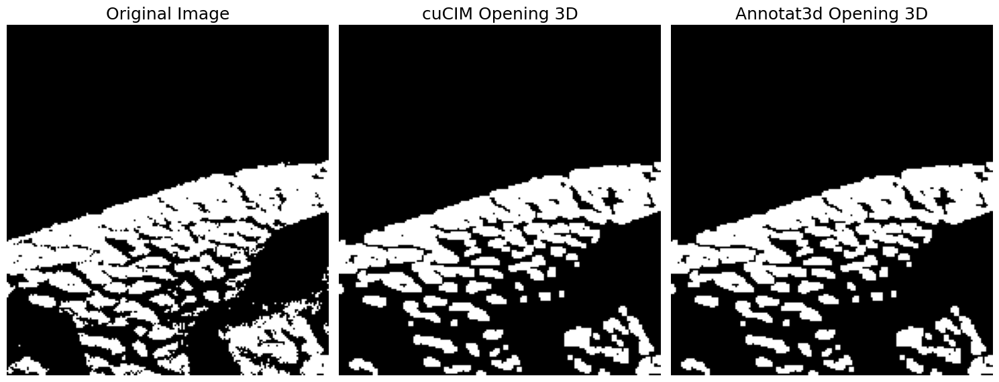

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [121]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_binary.opening_binary(image_binary, kernel)
result_custum = result_custum.squeeze()

selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.binary_opening(cp.asarray(image_binary), selem).get()

compare_results(result_custum, result_groudtruth, image_binary, plot=True, operation = "Opening 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/binary_opening.png")

### Closing

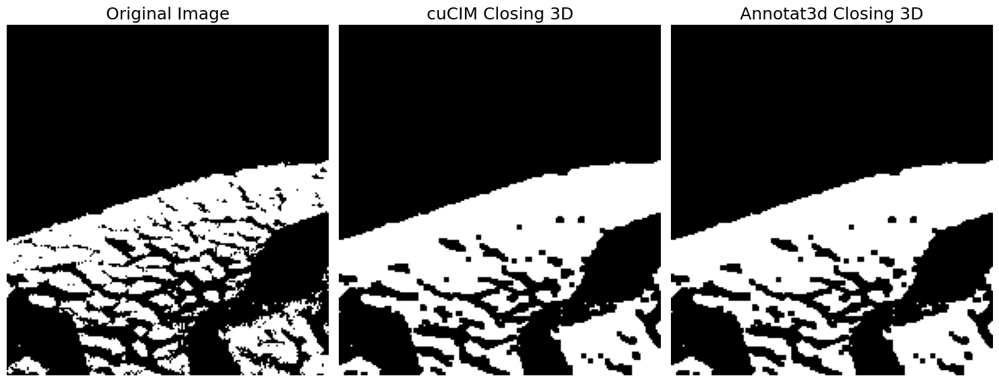

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [122]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_binary.closing_binary(image_binary, kernel)
result_custum = result_custum.squeeze()

selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.binary_closing(cp.asarray(image_binary), selem).get()

compare_results(result_custum, result_groudtruth, image_binary, plot=True, operation = "Closing 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/binary_closing.png")

### Reconstruction

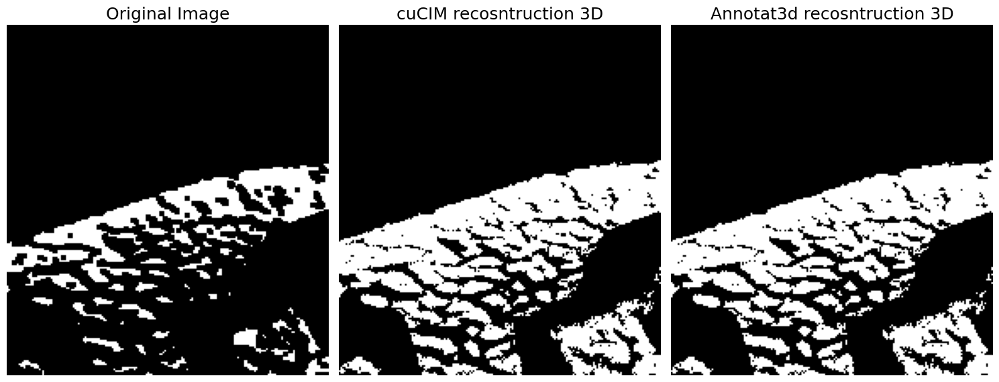

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [123]:
#Custum operation
kernel = custum_line_kernel3D()
marker = harpia_grayscale.erosion_grayscale(image_binary, kernel)

result_custum = harpia_binary.reconstruction_binary(marker,image_binary, "dilation")
result_custum = result_custum.squeeze()

#cuCIM operation
result_groudtruth = cucim_morph.reconstruction(cp.asarray(marker),cp.asarray(image_binary), method='dilation').get()

compare_results(result_custum, result_groudtruth, marker, plot=True, operation = "recosntruction 3D", 
                framework="cuCIM", slice_num=0, figsize = (15,30), save_path=f"{output_dir}/binary_reconstruction_dilation.png")

### Smoothing

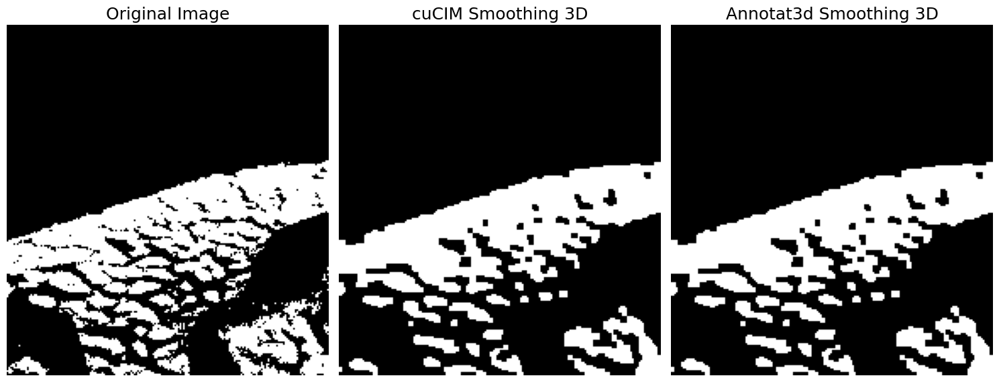

Accuracy: 100.00%
Mean Relative Error: 0.00%
Std Dev of Relative Error: 0.00%


In [126]:
#Custum operation
kernel = custum_kernel3D()
result_custum = harpia_binary.smooth_binary(image_binary, kernel)
result_custum = result_custum.squeeze()

#Scikit-learn operation
selem = cucim_morph.footprints.cube(3)
result_groudtruth = cucim_morph.binary_opening(cp.asarray(image_binary), selem).get()
result_groudtruth = cucim_morph.binary_closing(cp.asarray(result_groudtruth), selem).get()

compare_results(result_custum, result_groudtruth, image_binary, plot=True, operation = "Smoothing 3D", framework="cuCIM", 
                slice_num=0, figsize = (15,30), save_path=f"{output_dir}/binary_reconstruction_erosion.png")

### Fill Holes

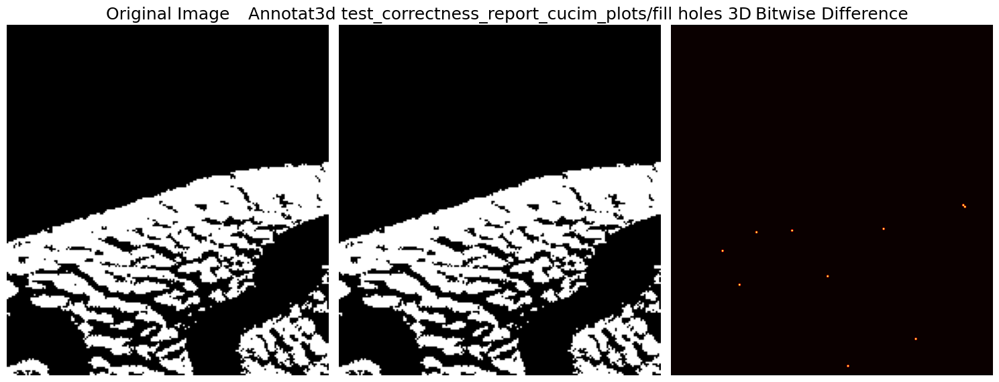

In [125]:
#Custum operation
result_custum = harpia_binary.fill_holes(image_binary)
result_custum = result_custum.squeeze()

show_results_diff(result_custum, image_binary, plot=True, operation = f"{output_dir}/fill holes 3D", slice_num=3, figsize = (15,30), save_path="binary_fill_holes3.png")